<table align="center">
 <td align="center"><a target="_blank" href="https://colab.research.google.com/github/TFMUCM01/TFM/blob/main/Analisis_Tecnico/Analisis_Tecnico.ipynb">
        <img src="https://colab.research.google.com/img/colab_favicon_256px.png"  
        width="50" height="50" style="padding-bottom:5px;" /><br>Run in Google Colab</a></td>
 <td align="center"><a target="_blank" href="https://github.com/TFMUCM01/TFM/blob/main/Analisis_Tecnico/Analisis_Tecnico.ipynb">
        <img src="https://github.githubassets.com/images/modules/logos_page/GitHub-Mark.png"  
        width="50" height="50" style="padding-bottom:5px;" /><br>View on GitHub</a></td>
</table>


In [14]:

import numpy as np
import pandas as pd
import snowflake.connector
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px


In [ ]:

conn = snowflake.connector.connect(
    user='TFMGRUPO4',
    password='TFMgrupo4ucm01_01#',
    account='VLNVLDD-WJ67583',   # << org-locator de tu URL
    warehouse='COMPUTE_WH',
    database='TFM',   # <--- CAMBIO
    schema='YAHOO_FINANCE',      # << Schema de la URL
    role='ACCOUNTADMIN'
)


In [1]:
# Tickers del IBEX 35 (5 principales)
tickers = [
    "IBE.MC",    # Iberdrola (Energía)
    "ITX.MC",    # Inditex (Textil/Retail)
    "TEF.MC",    # Telefónica (Telecomunicaciones)
    "BBVA.MC",   # BBVA (Banca)
    "SAN.MC",    # Santander (Banca)
    "REP.MC",    # Repsol (Petróleo y Gas)
    "AENA.MC",   # Aena (Aeropuertos/Infraestructura)
    "IAG.MC",    # International Airlines Group (Aerolíneas)
    "ENG.MC",    # Enagás (Infraestructura energética)
    "ACS.MC",    # ACS (Construcción e Infraestructura)
    "FER.MC",    # Ferrovial (Infraestructura y Construcción)
    "CABK.MC",   # CaixaBank (Banca)
    "ELE.MC",    # Endesa (Energía eléctrica)
    "MAP.MC"     # Mapfre (Seguros)
]
fecha_inicio = "2020-01-01"
fecha_fin = "2024-12-31"


In [2]:

# ================================
# Query de datos
# ================================
quoted_tickers = ",".join([f"'{ticker}'" for ticker in tickers])
query = f"""
SELECT TICKER, FECHA, CLOSE
FROM TICKERS_INDEX
WHERE TICKER IN ({quoted_tickers})
  AND FECHA BETWEEN '{fecha_inicio}' AND '{fecha_fin}'
  AND CLOSE IS NOT NULL
ORDER BY FECHA, TICKER
"""

cursor = conn.cursor()
cursor.execute(query)
column_names = [desc[0] for desc in cursor.description]
df_prices = pd.DataFrame(cursor.fetchall(), columns=column_names)
cursor.close()
conn.close()


NameError: name 'conn' is not defined

In [ ]:
df_prices.head()

,TICKER,FECHA,CLOSE
0,ACS.MC,2020-01-02,34.785518646
1,AENA.MC,2020-01-02,171.300003052
2,BBVA.MC,2020-01-02,5.110000134
3,CABK.MC,2020-01-02,2.898999929
4,ELE.MC,2020-01-02,23.870000839


In [ ]:
df_prices.dtypes

TICKER    object
FECHA     object
CLOSE     object
dtype: object

In [ ]:

df_prices['CLOSE'] = df_prices['CLOSE'].astype(float)
df_prices['FECHA'] = pd.to_datetime(df_prices['FECHA'])
df_prices.dtypes

TICKER            object
FECHA     datetime64[ns]
CLOSE            float64
dtype: object

In [ ]:

prices = df_prices.pivot(index='FECHA', columns='TICKER', values='CLOSE').sort_index()


In [ ]:
prices.head()

TICKER,ACS.MC,AENA.MC,BBVA.MC,CABK.MC,ELE.MC,ENG.MC,FER.MC,IAG.MC,IBE.MC,ITX.MC,MAP.MC,REP.MC,SAN.MC,TEF.MC
FECHA,,,,,,,,,,,,,,
2020-01-02,34.785519,171.300003,5.110,2.899,23.870001,22.830000,27.290001,4.955129,9.220,31.750000,2.414,14.065,3.704917,6.332
2020-01-03,34.360458,170.100006,5.054,2.874,23.820000,22.900000,27.100000,4.849052,9.178,31.809999,2.397,14.240,3.647417,6.337
2020-01-06,34.142986,169.000000,5.032,2.863,23.670000,22.860001,27.090000,4.737671,9.132,31.530001,2.402,14.350,3.617230,6.345
2020-01-07,34.241840,168.250000,5.010,2.885,23.170000,22.510000,27.500000,4.810599,8.954,31.930000,2.400,14.230,3.599980,6.249
2020-01-08,34.340691,168.600006,5.058,2.886,23.000000,22.719999,27.660000,4.827836,8.984,32.000000,2.400,14.360,3.602375,6.161


In [ ]:
prices.describe()

TICKER,ACS.MC,AENA.MC,BBVA.MC,CABK.MC,ELE.MC,ENG.MC,FER.MC,IAG.MC,IBE.MC,ITX.MC,MAP.MC,REP.MC,SAN.MC,TEF.MC
count,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000,1281.000000
mean,28.670892,145.860039,5.987619,3.281289,19.961889,17.867689,27.584637,1.936368,10.897290,31.378634,1.879196,11.796255,3.186112,4.013493
std,7.237946,23.695358,2.219713,1.067634,2.179016,2.813140,5.247896,0.676000,1.072242,8.753611,0.269572,2.581087,0.790683,0.553552
min,11.313448,91.900002,2.160000,1.522000,14.270000,11.670000,17.490000,0.998400,8.152000,19.709999,1.280000,5.226000,1.473533,2.794000
25%,22.854252,129.800003,4.513500,2.508000,18.375000,15.865000,23.920000,1.600500,10.255000,24.430000,1.687000,10.100000,2.679000,3.698000
50%,26.541380,142.000000,5.500000,3.168000,19.605000,18.195000,25.889999,1.811500,10.815000,29.139999,1.841000,12.060000,3.156500,3.950000
75%,33.144596,155.100006,7.446000,3.861000,21.360001,19.820000,29.719999,2.036000,11.440000,34.970001,1.985000,13.890000,3.621000,4.210000
max,48.439999,210.399994,11.235000,5.854000,26.120001,26.040001,41.040001,5.221648,14.175000,55.980000,2.692000,16.174999,4.878000,6.540000


In [ ]:
prices.isnull().sum()

TICKER
ACS.MC     0
AENA.MC    0
BBVA.MC    0
CABK.MC    0
ELE.MC     0
ENG.MC     0
FER.MC     0
IAG.MC     0
IBE.MC     0
ITX.MC     0
MAP.MC     0
REP.MC     0
SAN.MC     0
TEF.MC     0
dtype: int64

In [ ]:
prices.head()

TICKER,ACS.MC,AENA.MC,BBVA.MC,CABK.MC,ELE.MC,ENG.MC,FER.MC,IAG.MC,IBE.MC,ITX.MC,MAP.MC,REP.MC,SAN.MC,TEF.MC
FECHA,,,,,,,,,,,,,,
2020-01-02,34.785519,171.300003,5.110,2.899,23.870001,22.830000,27.290001,4.955129,9.220,31.750000,2.414,14.065,3.704917,6.332
2020-01-03,34.360458,170.100006,5.054,2.874,23.820000,22.900000,27.100000,4.849052,9.178,31.809999,2.397,14.240,3.647417,6.337
2020-01-06,34.142986,169.000000,5.032,2.863,23.670000,22.860001,27.090000,4.737671,9.132,31.530001,2.402,14.350,3.617230,6.345
2020-01-07,34.241840,168.250000,5.010,2.885,23.170000,22.510000,27.500000,4.810599,8.954,31.930000,2.400,14.230,3.599980,6.249
2020-01-08,34.340691,168.600006,5.058,2.886,23.000000,22.719999,27.660000,4.827836,8.984,32.000000,2.400,14.360,3.602375,6.161


In [ ]:

rendimientos = (prices - prices.shift(1)) / prices.shift(1)


In [ ]:

numero_activos = len(rendimientos.columns)


In [ ]:

rendimientos_portafolio = []
riesgo_portafolio = []
peso_portafolio = []


In [ ]:


for x in range(50000):
    pesos = np.random.random(numero_activos)
    pesos /= np.sum(pesos)
    rendimiento = np.sum(pesos * rendimientos.mean()) * 252
    riesgo = np.sqrt(np.dot(pesos.T, np.dot(rendimientos.cov() * 252, pesos)))
    rendimientos_portafolio.append(rendimiento)
    riesgo_portafolio.append(riesgo)
    peso_portafolio.append(pesos)



In [ ]:
peso_portafolio

[array([0.08185722, 0.09801751, 0.08454452, 0.085708  , 0.07851235,
        0.0518405 , 0.09710494, 0.03877293, 0.01478073, 0.07117079,
        0.0805892 , 0.08812234, 0.07822301, 0.05075595]),
 array([0.1017222 , 0.01948349, 0.087592  , 0.09925344, 0.1139162 ,
        0.11225274, 0.06772894, 0.03034129, 0.11539616, 0.04062402,
        0.03044404, 0.01071241, 0.06120268, 0.10933041]),
 array([0.10362339, 0.1209508 , 0.02409035, 0.07545833, 0.02261632,
        0.11759753, 0.10278556, 0.10814622, 0.0296269 , 0.02002292,
        0.13970233, 0.03362219, 0.06421897, 0.03753818]),
 array([0.12742529, 0.04148549, 0.0047123 , 0.09299352, 0.01025074,
        0.00407104, 0.09434636, 0.09824129, 0.02768911, 0.10429727,
        0.04784221, 0.11956901, 0.10806465, 0.11901172]),
 array([0.11904674, 0.02214404, 0.0390256 , 0.01529235, 0.01264729,
        0.04379656, 0.08526822, 0.1007169 , 0.13618658, 0.09932089,
        0.08332457, 0.13252731, 0.10309648, 0.00760648]),
 array([0.0689233 , 0.11226982

In [ ]:
rendimientos_portafolio

[0.08193188674460081,
 0.0681162555988208,
 0.06714552050480795,
 0.08265944461663058,
 0.08471196724546207,
 0.07832221153371353,
 0.08299219326450508,
 0.0664564483146747,
 0.053552731272589214,
 0.07026418616516228,
 0.08588225644370609,
 0.07975143708702509,
 0.06863436127776032,
 0.09228132489277006,
 0.07779391678528627,
 0.08450321857819697,
 0.0658837517831486,
 0.0990277855696453,
 0.08006040122129734,
 0.06569027401455177,
 0.07339602521284945,
 0.06518212112782423,
 0.07146809724692016,
 0.0796650034799428,
 0.0776746815999065,
 0.09218195592567073,
 0.0691731628898244,
 0.0734739568716958,
 0.06047486963923741,
 0.08569713064152538,
 0.06639124558810691,
 0.07139932150739149,
 0.07532454035132355,
 0.06021949581013268,
 0.09795851361585409,
 0.07926888428964896,
 0.07643274170700139,
 0.10110503783227068,
 0.058865951414530215,
 0.0720670992732762,
 0.07026577772019998,
 0.07167571052582838,
 0.08467046316407315,
 0.03746119095414795,
 0.08485631857950254,
 0.07441859627553

In [ ]:

# creamos el diccionario con el rendimiento , riesgo y pesos de cada portafolio
portafolios = {
    'Rendimientos': rendimientos_portafolio,
    'Riesgos': riesgo_portafolio,
}

for contador, ticker in enumerate(rendimientos.columns.tolist()):
    portafolios["Peso" + ticker] = [W [contador] for W in peso_portafolio]


In [ ]:
Matriz_portafolios = pd.DataFrame(portafolios)
Matriz_portafolios

,Rendimientos,Riesgos,PesoACS.MC,PesoAENA.MC,PesoBBVA.MC,PesoCABK.MC,PesoELE.MC,PesoENG.MC,PesoFER.MC,PesoIAG.MC,PesoIBE.MC,PesoITX.MC,PesoMAP.MC,PesoREP.MC,PesoSAN.MC,PesoTEF.MC
0,0.081932,0.234042,0.081857,0.098018,0.084545,0.085708,0.078512,0.051840,0.097105,0.038773,0.014781,0.071171,0.080589,0.088122,0.078223,0.050756
1,0.068116,0.214714,0.101722,0.019483,0.087592,0.099253,0.113916,0.112253,0.067729,0.030341,0.115396,0.040624,0.030444,0.010712,0.061203,0.109330
2,0.067146,0.238647,0.103623,0.120951,0.024090,0.075458,0.022616,0.117598,0.102786,0.108146,0.029627,0.020023,0.139702,0.033622,0.064219,0.037538
3,0.082659,0.249997,0.127425,0.041485,0.004712,0.092994,0.010251,0.004071,0.094346,0.098241,0.027689,0.104297,0.047842,0.119569,0.108065,0.119012
4,0.084712,0.238984,0.119047,0.022144,0.039026,0.015292,0.012647,0.043797,0.085268,0.100717,0.136187,0.099321,0.083325,0.132527,0.103096,0.007606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.059773,0.229058,0.078565,0.089221,0.064017,0.001696,0.084979,0.099778,0.012787,0.102895,0.085630,0.074850,0.110560,0.101353,0.057723,0.035944
49996,0.094548,0.233942,0.043096,0.081160,0.135319,0.043337,0.031158,0.041055,0.164217,0.051950,0.101314,0.057595,0.083589,0.074697,0.069150,0.022362
49997,0.068736,0.221785,0.038784,0.026820,0.096951,0.109841,0.075690,0.073123,0.029631,0.065728,0.129539,0.042636,0.104905,0.043627,0.035124,0.127601
49998,0.096032,0.230883,0.105615,0.095941,0.116903,0.091434,0.031648,0.056659,0.135828,0.017243,0.074682,0.079447,0.038400,0.005261,0.077970,0.072969


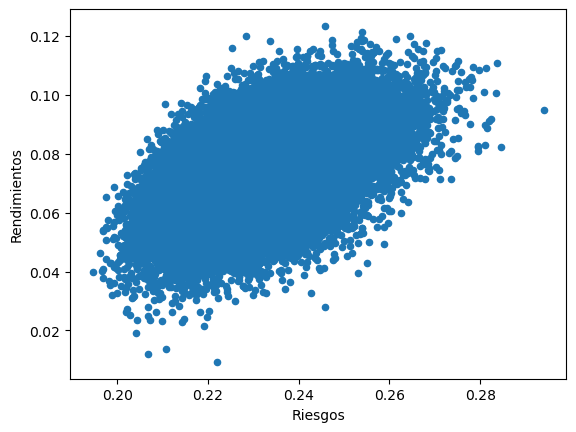

In [ ]:
#frontera de eficiencia
Matriz_portafolios.plot(x='Riesgos', y='Rendimientos', kind='scatter');

In [ ]:
#varianza minima
varianza_minima = Matriz_portafolios.iloc[Matriz_portafolios['Riesgos'].idxmin()]


C:\Users\jcrom\AppData\Local\Temp\ipykernel_18068\14309161.py:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



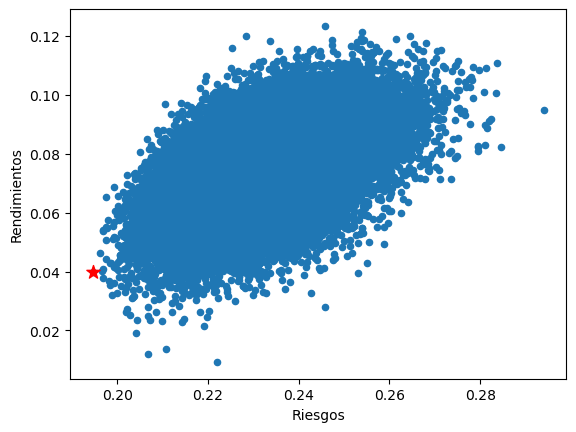

In [ ]:
#frontera de eficiencia
Matriz_portafolios.plot(x='Riesgos', y='Rendimientos', kind='scatter')
plt.scatter(x=varianza_minima[1], y=varianza_minima[0], color='red',marker='*', s=100);


In [ ]:
# portafolio optimo
risk_free = 0.03
portafolio_optimo = Matriz_portafolios.iloc[((Matriz_portafolios['Rendimientos'] - risk_free) / Matriz_portafolios['Riesgos']).idxmax()]
portafolio_optimo

Rendimientos    0.120055
Riesgos         0.228396
PesoACS.MC      0.137052
PesoAENA.MC     0.004925
PesoBBVA.MC     0.102294
PesoCABK.MC     0.161420
PesoELE.MC      0.013770
PesoENG.MC      0.000296
PesoFER.MC      0.136757
PesoIAG.MC      0.000409
PesoIBE.MC      0.137391
PesoITX.MC      0.160755
PesoMAP.MC      0.031297
PesoREP.MC      0.066129
PesoSAN.MC      0.013307
PesoTEF.MC      0.034199
Name: 29163, dtype: float64

C:\Users\jcrom\AppData\Local\Temp\ipykernel_18068\296694422.py:2: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\jcrom\AppData\Local\Temp\ipykernel_18068\296694422.py:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



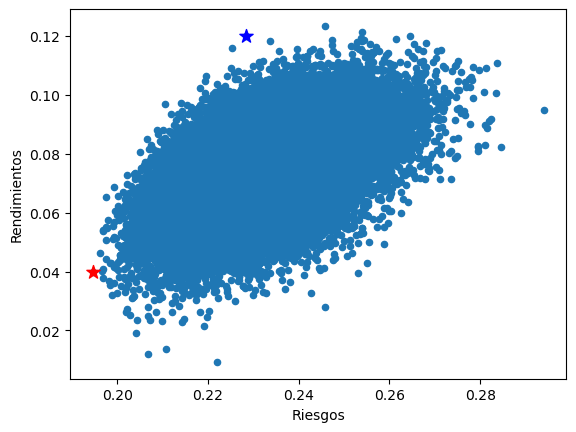

In [ ]:
Matriz_portafolios.plot(x='Riesgos', y='Rendimientos', kind='scatter')
plt.scatter(x=varianza_minima[1], y=varianza_minima[0], color='red',marker='*', s=100)
plt.scatter(x=portafolio_optimo[1], y=portafolio_optimo[0], color='blue',marker='*', s=100);

In [ ]:

# ================================
# Gráfico frontera de eficiencia
# ================================
fig = go.Figure()

# Scatter de todos los portafolios
customdata_info = []
for i in range(len(Matriz_portafolios)):
    sharpe = (Matriz_portafolios.iloc[i]['Rendimientos'] - risk_free) / Matriz_portafolios.iloc[i]['Riesgos']
    composicion = crear_info_composicion(i)
    customdata_info.append([sharpe, composicion])

fig.add_trace(go.Scatter(
    x=Matriz_portafolios['Riesgos'],
    y=Matriz_portafolios['Rendimientos'],
    mode='markers',
    marker=dict(size=5, color=Matriz_portafolios['Rendimientos'], colorscale='Viridis', opacity=0.7,
                colorbar=dict(title="Rendimiento<br>Esperado", titleside="right")),
    name='Portafolios simulados',
    hovertemplate='<b>📊 Portafolio Simulado</b><br>'
                  '<b>Riesgo:</b> %{x:.3f}<br>'
                  '<b>Rendimiento:</b> %{y:.3f}<br>'
                  '<b>Ratio Sharpe:</b> %{customdata[0]:.3f}<br>'
                  '<br><b>💼 Composición del Portafolio:</b><br>'
                  '%{customdata[1]}<br>'
                  '<extra></extra>',
    customdata=customdata_info
))

# Mínima varianza
composicion_mv = crear_composicion_detallada(varianza_minima)
fig.add_trace(go.Scatter(
    x=[varianza_minima['Riesgos']], y=[varianza_minima['Rendimientos']],
    mode='markers', marker=dict(symbol='star', size=18, color='green', line=dict(color='darkgreen', width=2)),
    name='Mínima varianza',
    hovertemplate='<b>🌟 Portafolio de Mínima Varianza</b><br>'
                  '<b>Riesgo:</b> %{x:.4f}<br>'
                  '<b>Rendimiento:</b> %{y:.4f}<br>'
                  '<br><b>💼 Composición del Portafolio:</b><br>' + f'{composicion_mv}<br>'
                  '<extra></extra>'
))

# Sharpe máximo
sharpe_ratio = (portafolio_optimo['Rendimientos'] - risk_free) / portafolio_optimo['Riesgos']
composicion_opt = crear_composicion_detallada(portafolio_optimo)
fig.add_trace(go.Scatter(
    x=[portafolio_optimo['Riesgos']], y=[portafolio_optimo['Rendimientos']],
    mode='markers', marker=dict(symbol='star', size=18, color='blue', line=dict(color='darkblue', width=2)),
    name='Sharpe máximo',
    hovertemplate='<b>🎯 Portafolio Óptimo (Sharpe máximo)</b><br>'
                  '<b>Riesgo:</b> %{x:.4f}<br>'
                  '<b>Rendimiento:</b> %{y:.4f}<br>'
                  f'<b>Ratio Sharpe:</b> {sharpe_ratio:.4f}<br>'
                  '<br><b>💼 Composición del Portafolio:</b><br>' + f'{composicion_opt}<br>'
                  '<extra></extra>'
))

# Layout
fig.update_layout(
    title=dict(text='📈 Frontera de Eficiencia - Portafolios IBEX 35', x=0.5,
               font=dict(size=16, family="Arial", color='darkblue')),
    xaxis=dict(title='Riesgo (Volatilidad)', titlefont=dict(size=12), tickfont=dict(size=10),
               gridcolor='lightgray', gridwidth=0.5, showgrid=True),
    yaxis=dict(title='Rendimiento Esperado', titlefont=dict(size=12), tickfont=dict(size=10),
               gridcolor='lightgray', gridwidth=0.5, showgrid=True),
    plot_bgcolor='white', paper_bgcolor='white',
    hovermode='closest', width=1000, height=700, showlegend=True,
    legend=dict(x=0.02, y=0.98, bgcolor='rgba(255,255,255,0.9)', bordercolor='gray', borderwidth=1, font=dict(size=10))
)

# Anotaciones
fig.add_annotation(x=varianza_minima['Riesgos'], y=varianza_minima['Rendimientos'],
                   text="🌟 Mínima<br>Varianza", showarrow=True, arrowhead=2, arrowsize=1,
                   arrowwidth=2, arrowcolor="green", ax=30, ay=-40, font=dict(size=10, color="green"))

fig.add_annotation(x=portafolio_optimo['Riesgos'], y=portafolio_optimo['Rendimientos'],
                   text="🎯 Sharpe<br>Máximo", showarrow=True, arrowhead=2, arrowsize=1,
                   arrowwidth=2, arrowcolor="blue", ax=30, ay=-40, font=dict(size=10, color="blue"))

fig.show()